In [5]:
# Install core dependencies
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu118
!pip install hydra-core iopath pycocotools opencv-python matplotlib Pillow huggingface_hub
!pip install 'git+https://github.com/facebookresearch/detectron2.git'
!pip install --quiet --upgrade torch==2.0.1+cu118 torchvision==0.15.2+cu118 torchaudio==2.0.2+cu118 \
    -f https://download.pytorch.org/whl/torch_stable.html

Looking in indexes: https://download.pytorch.org/whl/cu118
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 10.1 MB/s eta 0:00:00
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31527 sha256=81b77236ceec24d62efa12dd4ccd2f694453e0c3b2aeef1d6d83371463a66d4e
  Stored in directory: /root/.cache/pip/wheels/7c/96/04/4f5f31ff812f684f69f40cb1634357812220aac58d4698048c
Successfully built iopath
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-dwhztj3r
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-dwhztj3r
  Resolved https://github.com/facebookresearch/detectron2.git to commit fd27788985af0f4ca800bca563acdb700bb890e2
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 3.4 MB/s eta 0:0

In [2]:
# Clone SAM2 Repository
!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2

fatal: destination path 'segment-anything-2' already exists and is not an empty directory.
/content/segment-anything-2


In [3]:
from google.colab import files
uploaded = files.upload()  # sam2_hiera_tiny.pt and sam2_hiera_t.yaml


Saving sam2_hiera_tiny.pt to sam2_hiera_tiny (1).pt


In [4]:
from google.colab import files
uploaded = files.upload()  # sam2_hiera_tiny.pt and sam2_hiera_t.yaml


Saving sam2_hiera_t.yaml to sam2_hiera_t (1).yaml


In [1]:
from google.colab import files
uploaded = files.upload()  # choose data_2D.zip here

Saving data_2D.zip to data_2D.zip


In [6]:
# Import Libraries

import os
import glob
import shutil
import numpy as np
import torch
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image


In [7]:
# Clone & Install SAM2 Locally

!git clone https://github.com/facebookresearch/segment-anything-2.git
%cd segment-anything-2
!pip install -e .
%cd /content


Cloning into 'segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 22.85 MiB/s, done.
Resolving deltas: 100% (380/380), done.
/content/segment-anything-2/segment-anything-2
Obtaining file:///content/segment-anything-2/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for SAM-2 (pyproject.toml) ... done
  Created wheel for SAM-2: filename=sam_2-1.0-0.editable-cp312-cp312-linux_x86_64.whl size=13866 sha256=631c0d4035ce8d33b820923fab3428c55a59556c1170b58306a0b7e6fffb6471
  Stored in directory: /tmp/pip-ephem-wheel-cache-8qvjh6wm/wheels/cf/67/cd/7bc24384c0ee1193fc96e724f9a773162e0b4cded2b125d297
Successfully built SAM-2
/content


In [10]:
!pwd
!ls
!ls /content/segment-anything-2 | head


/content
data_2D.zip  sample_data  segment-anything-2
assets
backend.Dockerfile
checkpoints
CODE_OF_CONDUCT.md
CONTRIBUTING.md
demo
docker-compose.yaml
INSTALL.md
LICENSE
LICENSE_cctorch


In [11]:
import sam2
print("sam2 OK")


sam2 OK


In [9]:
import sys
import os

# Define the expected path to the SAM2 repository root.
# Based on the output of cell yPCejkThnGrN, it seems the effective root for the 'sam2' module
# after the `cd` command is /content/segment-anything-2/segment-anything-2
sam2_repo_root = "/content/segment-anything-2/segment-anything-2"

# Add the repository root to sys.path if not already present
if sam2_repo_root not in sys.path:
    sys.path.insert(0, sam2_repo_root)

from sam2.build_sam import build_sam2, build_sam2_video_predictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator
from sam2.sam2_image_predictor import SAM2ImagePredictor

In [20]:
# Define Tracking Function

def track_item_boxes(imgpath1, imgpath2, img1boxclasslist, visualize=True):
    create_if_not_exists(tempfolder)
    cleardir(tempfolder)
    shutil.copy(imgpath1, tempfolder + "/00000.jpg")
    shutil.copy(imgpath2, tempfolder + "/00001.jpg")

    inference_state = predictor_vid.init_state(video_path="./tempdir")
    predictor_vid.reset_state(inference_state)

    ann_frame_idx = 0
    for img1boxclass in img1boxclasslist:
        ([xmin, xmax, ymin, ymax], objectnumint) = img1boxclass
        box = np.array([xmin, ymin, xmax, ymax], dtype=np.float32)
        _, out_obj_ids, out_mask_logits = predictor_vid.add_new_points_or_box(
            inference_state=inference_state,
            frame_idx=ann_frame_idx,
            obj_id=objectnumint,
            box=box,
        )

    video_segments = {}

    for out_frame_idx, out_obj_ids, out_mask_logits in predictor_vid.propagate_in_video(inference_state):
        video_segments[out_frame_idx] = {
            out_obj_id: (out_mask_logits[i] > 0.0).cpu().numpy()
            for i, out_obj_id in enumerate(out_obj_ids)
        }

    if visualize:
        fig, ax = plt.subplots()
        plt.title("Original Image")
        ax.imshow(Image.open(tempfolder + "/00000.jpg"))
        rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.show()

        out_frame_idx = 1
        plt.figure(figsize=(6, 4))
        plt.title(f"detected object in test image ::")
        plt.imshow(Image.open(tempfolder + "/00001.jpg"))
        for out_obj_id, out_mask in video_segments[out_frame_idx].items():
            show_mask(out_mask, plt.gca(), obj_id=out_obj_id)

    return video_segments


In [14]:
!rm -rf CMU10_3D
!unzip -q data_2D.zip
!find . -maxdepth 3 -type d -name "data_2D"


./__MACOSX/data_2D
./data_2D


In [17]:
import glob, os

DATA_2D_DIR = "/content/data_2D"

print("jpg:", len(glob.glob(os.path.join(DATA_2D_DIR,"*.jpg"))))
print("gt :", len(glob.glob(os.path.join(DATA_2D_DIR,"*_gt.png"))))
print(sorted(glob.glob(os.path.join(DATA_2D_DIR,"can_chowder_000001*"))))


jpg: 500
gt : 750
['/content/data_2D/can_chowder_000001.jpg', '/content/data_2D/can_chowder_000001_1_gt.png']


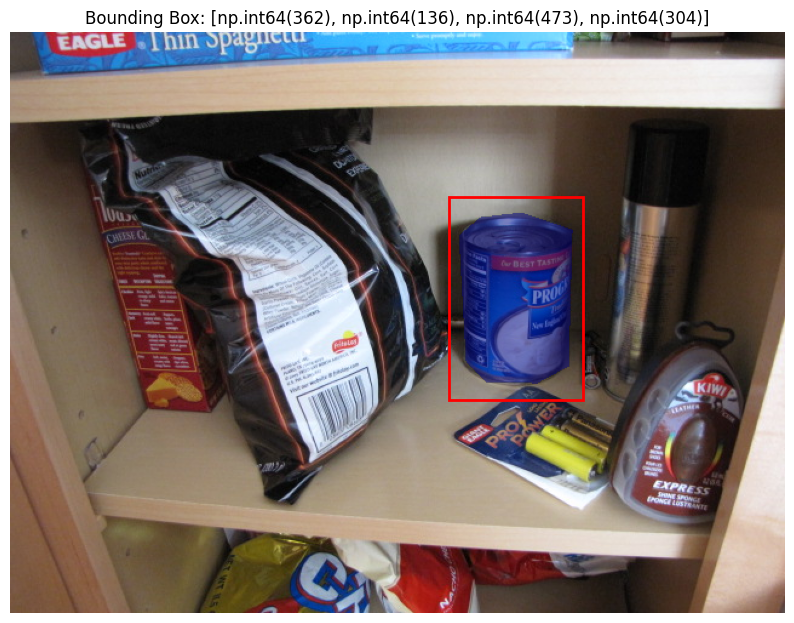

Bounding box: [np.int64(362), np.int64(136), np.int64(473), np.int64(304)]


In [22]:
# Process Image & Mask

import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def process_img_mask_pair(img_path, mask_path, visualize=True):
    """Simplified version to get bounding box from image-mask pair"""
    # Load and process images
    image = np.array(Image.open(img_path))
    mask = np.array(Image.open(mask_path)) > 128  # Convert to binary mask

    # Get bounding box with padding
    y, x = np.where(mask)
    if not x.size:  # If mask is empty
        bbox = [0, 0, *image.shape[:2][::-1]]  # [xmin, ymin, width, height]
    else:
        padding = 0.1  # 10% padding
        xmin, xmax = x.min(), x.max()
        ymin, ymax = y.min(), y.max()
        pad_x = int((xmax - xmin) * padding)
        pad_y = int((ymax - ymin) * padding)
        bbox = [
            max(0, xmin - pad_x),
            max(0, ymin - pad_y),
            min(image.shape[1], xmax + pad_x),
            min(image.shape[0], ymax + pad_y)
        ]

    # Visualization
    if visualize:
        plt.figure(figsize=(10, 10))
        plt.imshow(image)
        plt.imshow(np.ma.masked_where(~mask, mask), alpha=0.5, cmap='jet')
        plt.gca().add_patch(plt.Rectangle(
            (bbox[0], bbox[1]), bbox[2]-bbox[0], bbox[3]-bbox[1],
            linewidth=2, edgecolor='r', facecolor='none'
        ))
        plt.title(f"Bounding Box: {bbox}")
        plt.axis('off')
        plt.show()

    return bbox

# Usage remains the same
bbox = process_img_mask_pair(
    "/content/data_2D/can_chowder_000001.jpg",
    "/content/data_2D/can_chowder_000001_1_gt.png"
)
print("Bounding box:", bbox)


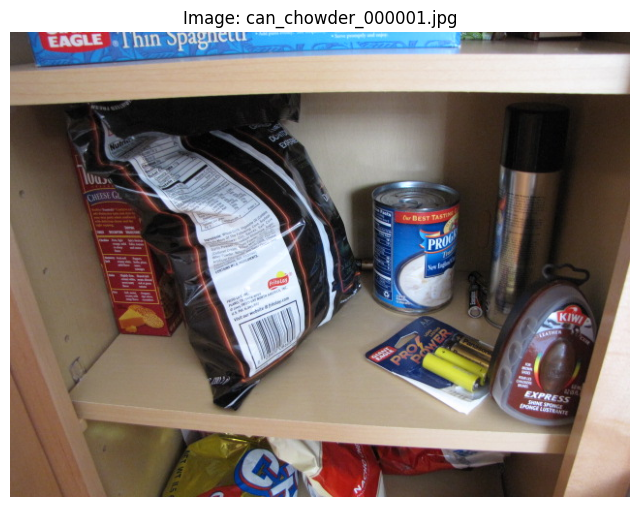

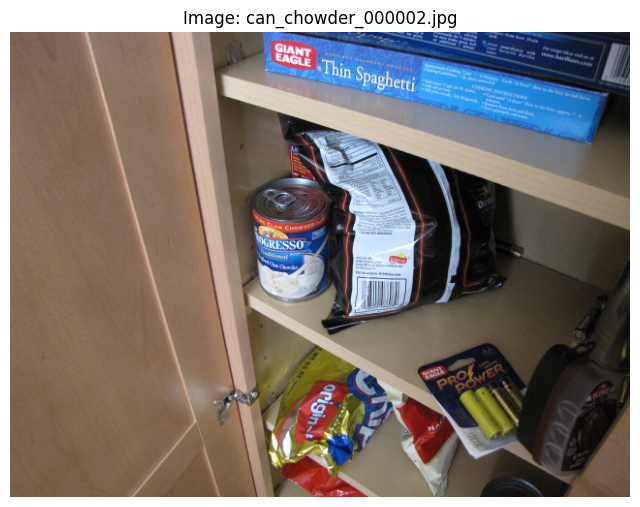

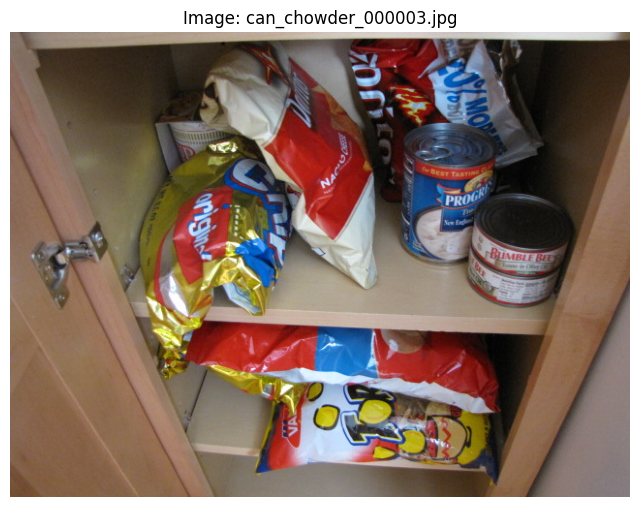

In [23]:
# Display & Check Multiple Images

import matplotlib.pyplot as plt
from PIL import Image

# Your paths
imgpaths = [
    '/content/data_2D/can_chowder_000001.jpg',
    '/content/data_2D/can_chowder_000002.jpg',
    '/content/data_2D/can_chowder_000003.jpg'
]


# Display each image
for path in imgpaths:
    img = Image.open(path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.title(f'Image: {path.split("/")[-1]}')  # Extracts filename
    plt.axis('off')
    plt.show()

In [24]:
# Verify Dataset Paths
import os
input_dir = '/content/data_2D'  # Your images and masks
output_dir = '/content/data_2D'  # Same as input_dir

# Verify files exist
print("Sample files in directory:")
print(os.listdir(input_dir)[:5])


Sample files in directory:
['carton_oj_000050_1_gt.png', 'ricepilaf_000022.jpg', 'rice_tuscan_000026_2_gt.png', 'diet_coke_000046_1_gt.png', 'can_soymilk_000043.jpg']


In [25]:
# Import SAM2 Libraries

import torch
from sam2.build_sam import build_sam2
from sam2.build_sam import build_sam2_video_predictor
import os, glob, shutil
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np


In [43]:
# ===================== SAM2 + DATA_2D ONE-SHOT SETUP (PASTE WHOLE CELL) =====================
import os, glob, torch

# --- 0) Install SAM2 fresh (avoids version mismatch) ---
!rm -rf /content/segment-anything-2
!git clone https://github.com/facebookresearch/segment-anything-2.git /content/segment-anything-2
%cd /content/segment-anything-2
!pip -q install -e .
%cd /content

import sam2
print("sam2:", sam2.__file__)
print("torch:", torch.__version__, "| cuda:", torch.cuda.is_available())
if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

# --- 1) Download correct checkpoint for CFG sam2_hiera_t ---
CKPT_DIR = "/content/checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

CFG_NAME = "sam2_hiera_t"  # config name only (no .yaml)
CKPT = f"{CKPT_DIR}/sam2_hiera_tiny.pt"
CKPT_URL = "https://dl.fbaipublicfiles.com/segment_anything_2/072824/sam2_hiera_tiny.pt"

!rm -f "$CKPT"
!curl -L --fail --retry 5 --retry-delay 2 -o "$CKPT" "$CKPT_URL"
!ls -lh "$CKPT"

ckpt_size = os.path.getsize(CKPT)
print("CKPT size bytes:", ckpt_size)
assert ckpt_size > 100_000_000, f"Checkpoint download looks wrong/partial: {ckpt_size} bytes"

# --- 2) Hydra init + build models ---
from hydra.core.global_hydra import GlobalHydra
from hydra import initialize_config_dir

from sam2.build_sam import build_sam2, build_sam2_video_predictor
from sam2.sam2_image_predictor import SAM2ImagePredictor
from sam2.automatic_mask_generator import SAM2AutomaticMaskGenerator

REPO = "/content/segment-anything-2"
CFG_DIR = os.path.join(REPO, "sam2", "configs", "sam2")
assert os.path.isdir(CFG_DIR), CFG_DIR

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using device:", device, "|", (torch.cuda.get_device_name(0) if device=="cuda" else "CPU"))

GlobalHydra.instance().clear()
initialize_config_dir(config_dir=CFG_DIR, job_name="sam2", version_base=None)

sam2_model = build_sam2(CFG_NAME, CKPT, device=device, apply_postprocessing=False)
predictor_prompt = SAM2ImagePredictor(sam2_model)
mask_generator = SAM2AutomaticMaskGenerator(sam2_model)
predictor_vid = build_sam2_video_predictor(CFG_NAME, CKPT, device=device)

print("✅ predictor_prompt:", type(predictor_prompt))
print("✅ mask_generator :", type(mask_generator))
print("✅ predictor_vid  :", type(predictor_vid))

# --- 3) Unzip data_2D.zip into /content/data_2D and verify ---
ZIP_PATH = "/content/data_2D.zip"
assert os.path.exists(ZIP_PATH), f"Upload data_2D.zip to /content first. Missing: {ZIP_PATH}"

!rm -rf /content/data_2D /content/__MACOSX
!unzip -q -o "$ZIP_PATH" -d /content

DATA_2D_DIR = "/content/data_2D"
assert os.path.isdir(DATA_2D_DIR), f"Expected folder missing: {DATA_2D_DIR}"

jpgs = sorted(glob.glob(os.path.join(DATA_2D_DIR, "*.jpg")))
gts  = sorted(glob.glob(os.path.join(DATA_2D_DIR, "*_gt.png")))
print("DATA_2D_DIR:", DATA_2D_DIR)
print("jpg:", len(jpgs), "| gt:", len(gts))

# sample pair (prefer can_chowder_000001 if present)
img_candidates = sorted(glob.glob(os.path.join(DATA_2D_DIR, "can_chowder_000001*.jpg")))
gt_candidates  = sorted(glob.glob(os.path.join(DATA_2D_DIR, "can_chowder_000001*_gt.png")))

if img_candidates and gt_candidates:
    SAMPLE_IMG = img_candidates[0]
    SAMPLE_GT  = gt_candidates[0]
else:
    SAMPLE_IMG = jpgs[0]
    # pick first gt that matches prefix if possible
    base = os.path.splitext(os.path.basename(SAMPLE_IMG))[0]
    match = sorted(glob.glob(os.path.join(DATA_2D_DIR, f"{base}*_gt.png")))
    SAMPLE_GT = match[0] if match else gts[0]

print("SAMPLE_IMG:", SAMPLE_IMG)
print("SAMPLE_GT :", SAMPLE_GT)

# Make these available to later cells
globals()["SAM2_CFG_NAME"] = CFG_NAME
globals()["SAM2_CKPT"] = CKPT
globals()["SAM2_DEVICE"] = device
globals()["DATA_2D_DIR"] = DATA_2D_DIR
globals()["SAMPLE_IMG"] = SAMPLE_IMG
globals()["SAMPLE_GT"] = SAMPLE_GT

print("✅ Setup complete. Use SAMPLE_IMG / SAMPLE_GT in your bbox + tracking cells.")
# ============================================================================================


Cloning into '/content/segment-anything-2'...
remote: Enumerating objects: 1070, done.
remote: Total 1070 (delta 0), reused 0 (delta 0), pack-reused 1070 (from 1)
Receiving objects: 100% (1070/1070), 128.11 MiB | 35.18 MiB/s, done.
Resolving deltas: 100% (381/381), done.
/content/segment-anything-2
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
  Building editable for SAM-2 (pyproject.toml) ... done
/content
sam2: /content/segment-anything-2/segment-anything-2/sam2/__init__.py
torch: 2.9.0+cu126 | cuda: True
GPU: NVIDIA L4
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  148M  100  148M    0     0   184M      0 --:--:-- --:--:-- --:--:--  184M
-rw-r--r-- 1 root root 149M Feb  5 13:25 /content/checkpoints/sam2_hiera_

In [44]:
# Temporary directory setup

tempfolder = "./tempdir"
def create_if_not_exists(dirname):
    if not os.path.exists(dirname):
        os.mkdir(dirname)
def cleardir(tempfolder):
    filepaths = glob.glob(tempfolder+"/*")
    for filepath in filepaths:
        os.unlink(filepath)

In [45]:
object_types = [
    'can_chowder', 'can_soymilk', 'can_tomatosoup',
    'carton_oj', 'carton_soymilk', 'diet_coke',
    'hc_potroastsoup', 'juicebox', 'rice_tuscan', 'ricepilaf'
]

In [52]:
import cv2

input_dir = '/content/data_2D'
results = []

for obj in object_types:
  print(f"\n🔍 Processing {obj}...")

# Get reference image and mask paths
  ref_img = f"{input_dir}/{obj}_000001.jpg"
  ref_mask = f"{input_dir}/{obj}_000001_1_gt.png"

# Get bounding box from mask (using provided approach)
  mask = np.array(Image.open(ref_mask))
  contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
  x,y,w,h = cv2.boundingRect(contours[0])
  ref_box = [x, x+w, y, y+h]

# Process all other images of this type
  all_images = [f for f in os.listdir(input_dir)
                 if f.startswith(obj) and f.endswith('.jpg') and not f.endswith('_000001.jpg')]

  for img_file in all_images:
          target_img = f"{input_dir}/{img_file}"

# Use provided track_item_boxes function
          video_segments = track_item_boxes(
              imgpath1=ref_img,
              imgpath2=target_img,
              img1boxclasslist=[(ref_box, 1)],  # Using object ID=1
              visualize=False)

# Get predicted mask
          pred_mask = video_segments[1][1]  # frame 1, object ID 1

# Save results
          results.append({
            'object': obj,
            'image': img_file,
            'pred_mask': pred_mask,
            'ref_box': ref_box})

print(f"✅ Processed {len(all_images)} images for {obj}")


🔍 Processing can_chowder...


frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 25.48it/s]
/content/segment-anything-2/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
propagate in video: 100%|██████████| 2/2 [00:00<00:00, 22.69it/s]



🔍 Processing can_soymilk...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 22.45it/s]



🔍 Processing can_tomatosoup...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.84it/s]



🔍 Processing carton_oj...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 22.65it/s]



🔍 Processing carton_soymilk...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.68it/s]



🔍 Processing diet_coke...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 22.06it/s]



🔍 Processing hc_potroastsoup...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.59it/s]



🔍 Processing juicebox...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.89it/s]



🔍 Processing rice_tuscan...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.87it/s]



🔍 Processing ricepilaf...


propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.59it/s]

✅ Processed 49 images for ricepilaf


Reference image exists: True
Reference mask exists: True
Target image exists: True

Running detection...


frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 36.01it/s]
/content/segment-anything-2/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.85it/s]


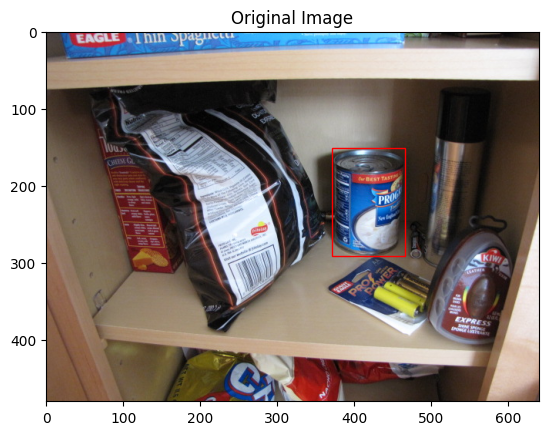

✅ Detection successful!


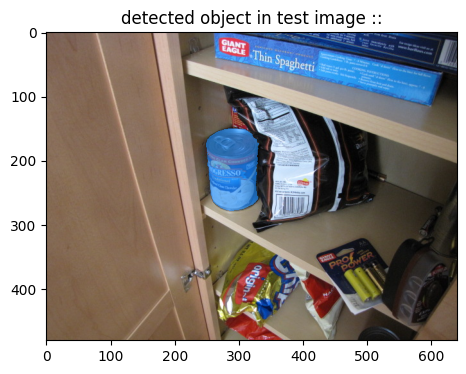

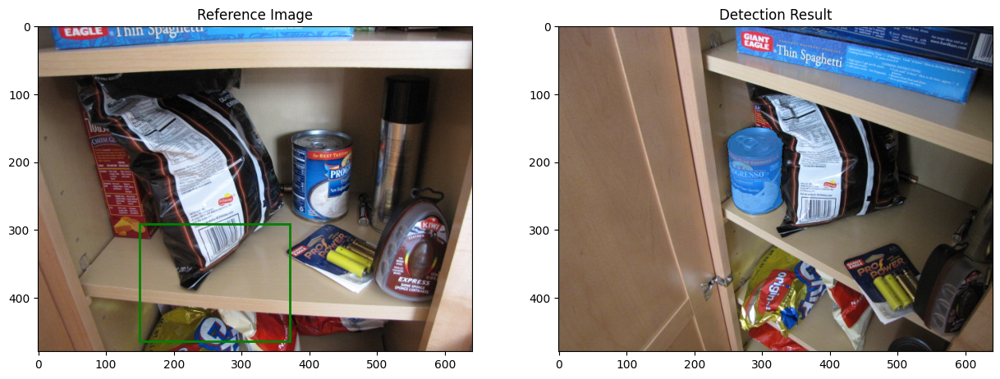

In [58]:
# 1. First define all required helper functions
def show_mask(mask, ax, obj_id=None, random_color=False):
    """Visualize a segmentation mask (provided in assignment)"""
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])  # Default blue color
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

def show_points(coords, labels, ax, marker_size=200):
    """Visualize input points (not used here but required)"""
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size)

def show_box(box, ax):
    """Visualize bounding box (provided in assignment)"""
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))


# 2. Now run your detection test
input_dir = '/content/data_2D'
test_obj = 'can_chowder'

# Verify files exist
ref_img = f"{input_dir}/{test_obj}_000001.jpg"
ref_mask = f"{input_dir}/{test_obj}_000001_1_gt.png"
target_img = f"{input_dir}/{test_obj}_000002.jpg"

print(f"Reference image exists: {os.path.exists(ref_img)}")
print(f"Reference mask exists: {os.path.exists(ref_mask)}")
print(f"Target image exists: {os.path.exists(target_img)}")

if not all([os.path.exists(ref_img), os.path.exists(ref_mask), os.path.exists(target_img)]):
    print("❌ Missing required files!")
else:

# Process reference mask
    mask = np.array(Image.open(ref_mask))
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x,y,w,h = cv2.boundingRect(contours[0])
    ref_box = [x, x+w, y, y+h]

# Run detection
    print("\nRunning detection...")
    video_segments = track_item_boxes(
        imgpath1=ref_img,
        imgpath2=target_img,
        img1boxclasslist=[(ref_box, 1)],
        visualize=True)

# Check results
    if video_segments and 1 in video_segments[1]:
        print("✅ Detection successful!")
        pred_mask = video_segments[1][1]

# Visualize results
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

# Original reference
        ax1.imshow(Image.open(ref_img))
        show_box(ref_box, ax1)
        ax1.set_title("Reference Image")

# Detection result
        ax2.imshow(Image.open(target_img))
        show_mask(pred_mask, ax2)
        ax2.set_title("Detection Result")
        plt.show()
    else:
        print("❌ Detection failed. Possible solutions:")
        print("1. Add padding to reference box (try [x-10, x+w+10, y-10, y+h+10])")
        print("2. Verify SAM2 model loaded correctly")
        print("3. Check image paths are correct")

In [60]:
import pandas as pd

output_data = []

for result in results:
    try:
        # Get the prediction mask
        pred_mask = result['pred_mask']

        # Handle different mask formats:
        # Case 1: If mask is 3D (H,W,1) or (1,H,W)
        if pred_mask.ndim == 3:
            pred_mask = pred_mask.squeeze()  # Remove single-dimensional entries

        # Case 2: If still not 2D, take first channel
        if pred_mask.ndim > 2:
            pred_mask = pred_mask[..., 0]  # Take first channel

        # Verify we have a 2D mask
        if pred_mask.ndim != 2:
            print(f"⚠️ Unexpected mask shape {pred_mask.shape} in {result['image']}")
            continue

        # Find object coordinates
        rows, cols = np.where(pred_mask)

        if len(rows) > 0:  # Only if object detected
            xmin, xmax = min(cols), max(cols)
            ymin, ymax = min(rows), max(rows)

            output_data.append({
                'object': result['object'],
                'image': result['image'],
                'pred_box': f"[{xmin}, {xmax}, {ymin}, {ymax}]"
            })

    except Exception as e:
        print(f"⚠️ Error processing {result.get('image','unknown')}: {str(e)}")

# Save results
if output_data:
    preds_path = f"{input_dir}/sam2_predictions.csv"
    pd.DataFrame(output_data).to_csv(preds_path, index=False)
    print(f"✅ Saved {len(output_data)} predictions to {preds_path}")

    # Show sample output
    print("\nSample predictions:")
    print(pd.DataFrame(output_data).head())
else:
    print("❌ No predictions to save! Check your detection results.")

✅ Saved 258 predictions to /content/data_2D/sam2_predictions.csv

Sample predictions:
        object                   image              pred_box
0  can_chowder  can_chowder_000011.jpg  [471, 565, 115, 243]
1  can_chowder  can_chowder_000008.jpg  [333, 479, 200, 345]
2  can_chowder  can_chowder_000032.jpg  [206, 470, 270, 479]
3  can_chowder  can_chowder_000021.jpg  [250, 416, 131, 280]
4  can_chowder  can_chowder_000043.jpg  [367, 488, 108, 286]


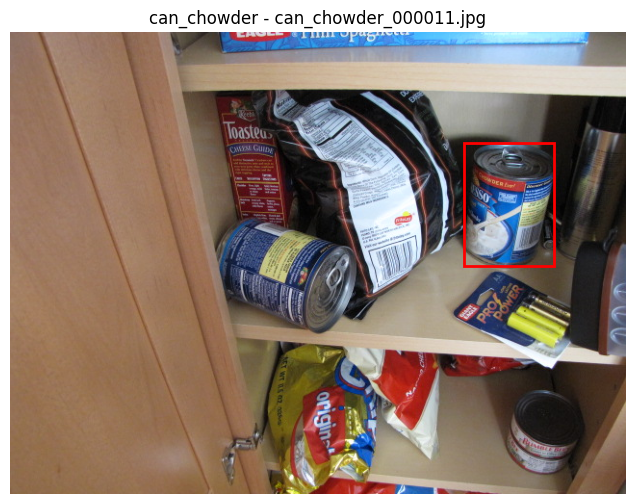

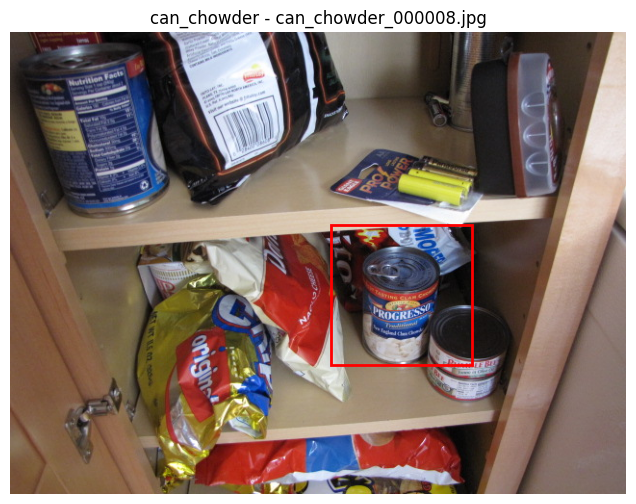

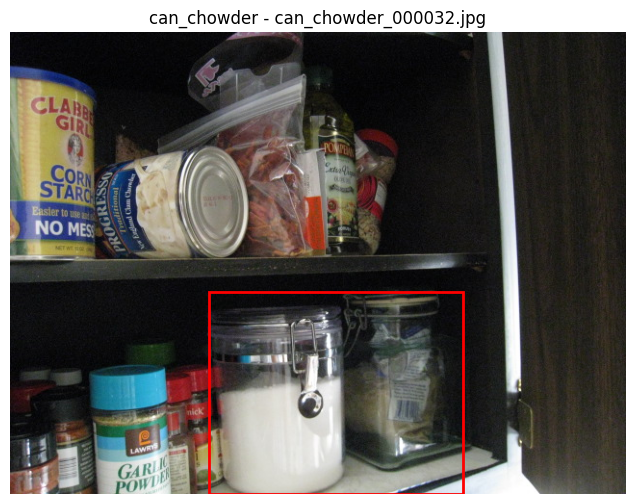

In [61]:
# Drawing Bounding Box

def plot_prediction(idx):
    """Plot prediction with bounding box overlay"""
    row = output_data[idx]
    img_path = f"{input_dir}/{row['image']}"
    img = Image.open(img_path)
    box = eval(row['pred_box'])  # Convert string to list

    fig, ax = plt.subplots(figsize=(8,6))
    ax.imshow(img)
    rect = patches.Rectangle(
        (box[0], box[2]), box[1]-box[0], box[3]-box[2],
        linewidth=2, edgecolor='r', facecolor='none'
    )
    ax.add_patch(rect)
    plt.title(f"{row['object']} - {row['image']}")
    plt.axis('off')
    plt.show()

# Visualize first 3 predictions
for i in range(3):
    plot_prediction(i)

In [62]:
# Analyze the sizes of predicted bounding boxes from your object
boxes = [eval(x['pred_box']) for x in output_data]
widths = [b[1]-b[0] for b in boxes]
heights = [b[3]-b[2] for b in boxes]

print(f"Average width: {np.mean(widths):.1f} ± {np.std(widths):.1f} px")
print(f"Average height: {np.mean(heights):.1f} ± {np.std(heights):.1f} px")
print(f"Total objects detected: {len(output_data)}")

Average width: 157.2 ± 88.8 px
Average height: 179.5 ± 63.9 px
Total objects detected: 258


In [63]:
# Load ground truth masks
gt_data = []
for pred in output_data:
    gt_path = f"{input_dir}/{pred['image'].replace('.jpg','_1_gt.png')}"
    if os.path.exists(gt_path):
        gt_mask = np.array(Image.open(gt_path))
        contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        if contours:
            x,y,w,h = cv2.boundingRect(contours[0])
            gt_data.append({
                'image': pred['image'],
                'gt_box': [x, x+w, y, y+h]
            })

# Create comparison DataFrame
comparison_df = pd.merge(
    pd.DataFrame(output_data),
    pd.DataFrame(gt_data),
    on='image'
)
print(f"Matched {len(comparison_df)} predictions with ground truth")

Matched 258 predictions with ground truth


✅ Total predictions available: 258


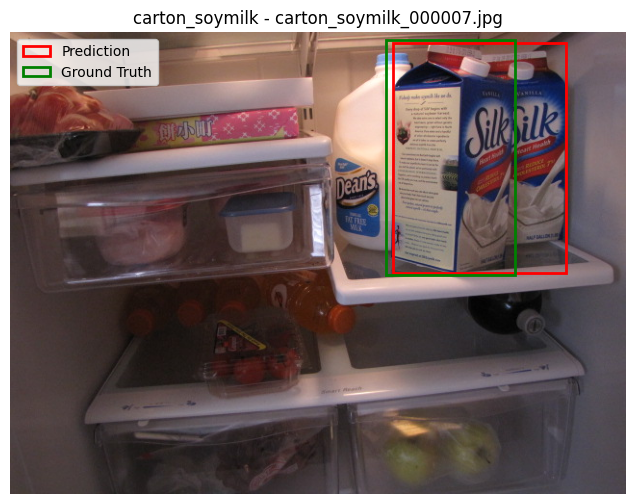

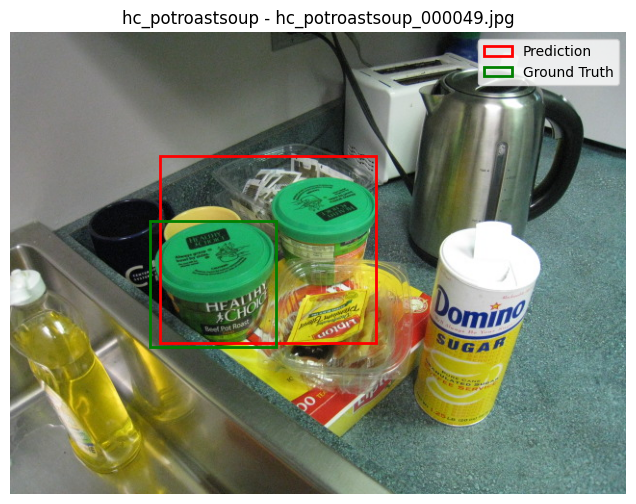

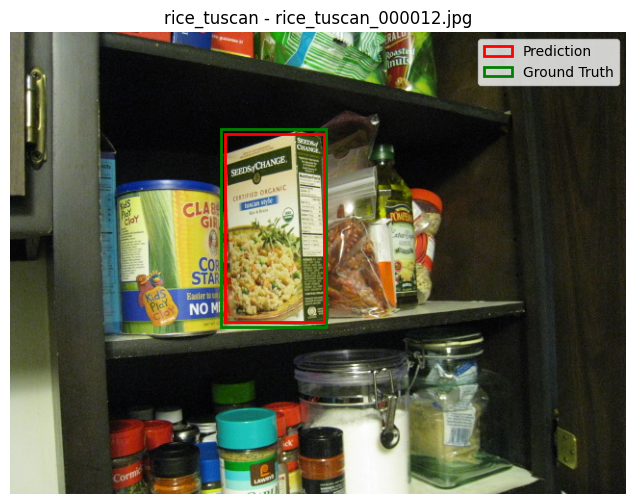

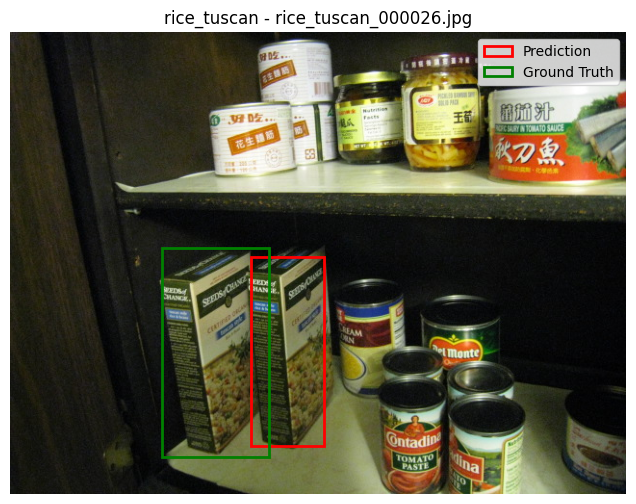

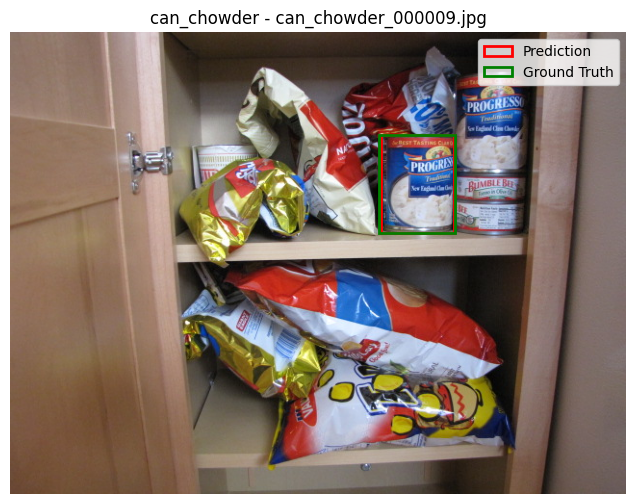

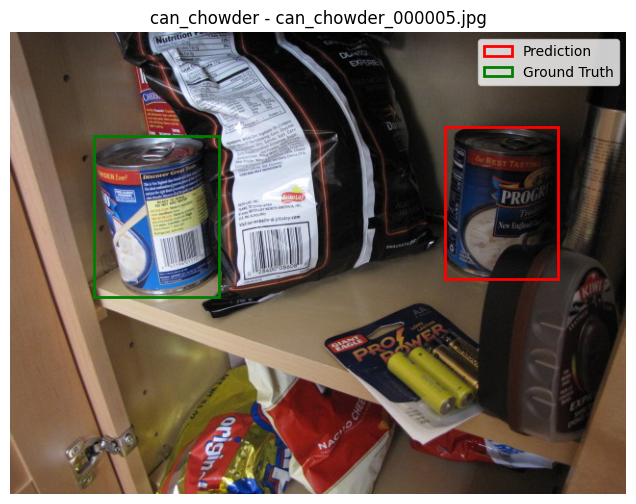

In [70]:
# === 1. Load predictions CSV ===
preds_path = f"{input_dir}/sam2_predictions.csv"
preds_df = pd.read_csv(preds_path)

# Convert bounding box strings "[..]" -> Python list
preds_df['pred_box'] = preds_df['pred_box'].apply(eval)

# === 2. Visualization function ===
def visualize_from_csv(img_name, df, img_dir, show_gt=True):
    """Visualize predicted box (and ground truth if available)."""
    row = df[df['image'] == img_name].iloc[0]
    img_path = os.path.join(img_dir, img_name)

    # Open image
    img = Image.open(img_path)
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.imshow(img)

    # Draw predicted box (red)
    xmin, xmax, ymin, ymax = row['pred_box']
    rect = patches.Rectangle(
        (xmin, ymin), xmax - xmin, ymax - ymin,
        linewidth=2, edgecolor='red', facecolor='none', label='Prediction'
    )
    ax.add_patch(rect)

    # Draw ground truth if exists
    if show_gt:
        gt_path = img_path.replace(".jpg", "_1_gt.png")
        if os.path.exists(gt_path):
            gt_mask = np.array(Image.open(gt_path))
            contours, _ = cv2.findContours(gt_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            if contours:
                x, y, w, h = cv2.boundingRect(contours[0])
                gt_rect = patches.Rectangle(
                    (x, y), w, h,
                    linewidth=2, edgecolor='green', facecolor='none', label='Ground Truth'
                )
                ax.add_patch(gt_rect)

    # Finalize
    plt.title(f"{row['object']} - {img_name}")
    plt.legend()
    plt.axis("off")
    plt.show()

# === 3. Visualize multiple samples ===
print(f"✅ Total predictions available: {len(preds_df)}")

# Change sample_size to len(preds_df) if you want ALL images
sample_size = min(6, len(preds_df))

for _, row in preds_df.sample(sample_size).iterrows():
    visualize_from_csv(row['image'], preds_df, input_dir, show_gt=True)


In [65]:


def extract_gt_boxes(mask_dir):
    """Extract bounding boxes from all ground truth masks"""
    gt_boxes = []

    for mask_file in os.listdir(mask_dir):
        if mask_file.endswith('_gt.png'):
            mask_path = os.path.join(mask_dir, mask_file)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

            # Find contours
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            for contour in contours:
                x, y, w, h = cv2.boundingRect(contour)
                gt_boxes.append({
                    'image': mask_file.replace('_gt.png', '.jpg'),
                    'gt_box': f"[{x}, {x+w}, {y}, {y+h}]"
                })

    return pd.DataFrame(gt_boxes)

# Run extraction
gt_df = extract_gt_boxes(input_dir)
gt_df.to_csv(f"{input_dir}/ground_truth_boxes.csv", index=False)
print(f"✅ Extracted {len(gt_df)} ground truth boxes")

✅ Extracted 750 ground truth boxes


In [66]:
print(gt_df.head())
print("Total GT boxes:", len(gt_df))


                      image                gt_box
0    carton_oj_000050_1.jpg  [103, 243, 102, 308]
1  rice_tuscan_000026_2.jpg  [247, 340, 219, 432]
2    diet_coke_000046_1.jpg   [195, 264, 81, 230]
3    ricepilaf_000006_1.jpg  [307, 385, 136, 264]
4    ricepilaf_000044_1.jpg  [249, 378, 149, 310]
Total GT boxes: 750


In [67]:
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
print(preds_df.head())
print("Total Predictions:", len(preds_df))


        object                   image              pred_box
0  can_chowder  can_chowder_000011.jpg  [471, 565, 115, 243]
1  can_chowder  can_chowder_000008.jpg  [333, 479, 200, 345]
2  can_chowder  can_chowder_000032.jpg  [206, 470, 270, 479]
3  can_chowder  can_chowder_000021.jpg  [250, 416, 131, 280]
4  can_chowder  can_chowder_000043.jpg  [367, 488, 108, 286]
Total Predictions: 258


In [69]:
import pandas as pd

# Load files
preds_df = pd.read_csv(f"{input_dir}/sam2_predictions.csv")
gt_df = pd.read_csv(f"{input_dir}/ground_truth_boxes.csv")

# --- Normalize filenames ---
# Remove suffix like "_1" or "_2" before ".jpg"
gt_df['image'] = gt_df['image'].str.replace(r'_\d+\.jpg$', '.jpg', regex=True)

print("After normalization:")
print(gt_df['image'].unique()[:5])
print(preds_df['image'].unique()[:5])

# --- Merge ---
merged_df = pd.merge(preds_df, gt_df, on='image')
print(f"✅ Matched {len(merged_df)} predictions with ground truth")

# --- IoU Calculation ---
def calculate_iou(box1, box2):
    """IoU between two boxes: [xmin, xmax, ymin, ymax]"""
    xA = max(box1[0], box2[0])
    yA = max(box1[2], box2[2])
    xB = min(box1[1], box2[1])
    yB = min(box1[3], box2[3])

    inter_area = max(0, xB - xA) * max(0, yB - yA)
    box1_area = (box1[1] - box1[0]) * (box1[3] - box1[2])
    box2_area = (box2[1] - box2[0]) * (box2[3] - box2[2])
    union_area = box1_area + box2_area - inter_area

    return inter_area / union_area if union_area > 0 else 0

# Apply IoU
merged_df['pred_box'] = merged_df['pred_box'].apply(eval)
merged_df['gt_box'] = merged_df['gt_box'].apply(eval)
merged_df['IoU'] = merged_df.apply(lambda r: calculate_iou(r['pred_box'], r['gt_box']), axis=1)

# Save results
merged_df.to_csv(f"{input_dir}/iou_results.csv", index=False)
print("✅ IoU results saved!")

# --- Summary ---
print("\nMean IoU per object class:")
print(merged_df.groupby('object')['IoU'].mean())


After normalization:
['carton_oj_000050.jpg' 'rice_tuscan_000026.jpg' 'diet_coke_000046.jpg'
 'ricepilaf_000006.jpg' 'ricepilaf_000044.jpg']
['can_chowder_000011.jpg' 'can_chowder_000008.jpg'
 'can_chowder_000032.jpg' 'can_chowder_000021.jpg'
 'can_chowder_000043.jpg']
✅ Matched 412 predictions with ground truth
✅ IoU results saved!

Mean IoU per object class:
object
can_chowder        0.448047
can_soymilk        0.405793
can_tomatosoup     0.276007
carton_oj          0.541873
carton_soymilk     0.495590
diet_coke          0.411536
hc_potroastsoup    0.520769
juicebox           0.478320
rice_tuscan        0.378443
ricepilaf          0.239382
Name: IoU, dtype: float64


In [71]:
import os, glob
import numpy as np
from PIL import Image

DATA_ROOT = "./data_2D"

OBJECT_TYPES = [
    "can_chowder",
    "can_soymilk",
    "can_tomatosoup",
    "carton_oj",
    "carton_soymilk",
    "diet_coke",
    "hc_potroastsoup",
    "juicebox",
    "rice_tuscan",
    "ricepilaf",
]

def gt_mask_png_to_bbox_xyxy(mask_png_path: str):
    m = (np.array(Image.open(mask_png_path).convert("L")) > 0)
    ys, xs = np.where(m)
    if xs.size == 0:
        return None
    return [int(xs.min()), int(xs.max()), int(ys.min()), int(ys.max())]  # [xmin,xmax,ymin,ymax]

def list_obj_files(obj: str):
    imgs = sorted(glob.glob(os.path.join(DATA_ROOT, f"{obj}_*.jpg")))
    gts  = sorted(glob.glob(os.path.join(DATA_ROOT, f"{obj}_*_gt.png")))
    return imgs, gts

def run_problem1_detect_all(visualize=False):
    outputs = {}  # obj -> list of {image, sam2_masks_dict}
    for obj in OBJECT_TYPES:
        imgs, gts = list_obj_files(obj)
        if len(imgs) < 2 or len(gts) < 1:
            continue

        first_img = imgs[0]
        first_gt  = gts[0]
        init_box = gt_mask_png_to_bbox_xyxy(first_gt)
        if init_box is None:
            continue

        obj_out = []
        for img_path in imgs[1:]:
            op = track_item_boxes(first_img, img_path, [(init_box, 1)], visualize=visualize)
            pred_masks_dict = op[1]  # per provided example: output mask is on op[1]
            obj_out.append({
                "image": os.path.basename(img_path),
                "pred_masks": pred_masks_dict,
            })

        outputs[obj] = obj_out

    return outputs

# Run
outputs = run_problem1_detect_all(visualize=False)
print({k: len(v) for k, v in outputs.items()})


frame loading (JPEG): 100%|██████████| 2/2 [00:00<00:00, 37.62it/s]
/content/segment-anything-2/segment-anything-2/sam2/sam2_video_predictor.py:786: UserWarning: cannot import name '_C' from 'sam2' (/content/segment-anything-2/segment-anything-2/sam2/__init__.py)

Skipping the post-processing step due to the error above. You can still use SAM 2 and it's OK to ignore the error above, although some post-processing functionality may be limited (which doesn't affect the results in most cases; see https://github.com/facebookresearch/sam2/blob/main/INSTALL.md).
propagate in video: 100%|██████████| 2/2 [00:00<00:00, 21.80it/s]

{'can_chowder': 49, 'can_soymilk': 49, 'can_tomatosoup': 49, 'carton_oj': 49, 'carton_soymilk': 49, 'diet_coke': 49, 'hc_potroastsoup': 49, 'juicebox': 49, 'rice_tuscan': 49, 'ricepilaf': 49}


In [ ]:
import numpy as np

def binmask_to_bbox_xyxy(mask):
    m = np.asarray(mask)

    # (1,H,W) -> (H,W)
    if m.ndim == 3 and m.shape[0] == 1:
        m = m[0]

    # (H,W,1) or (H,W,3) -> (H,W)
    if m.ndim == 3 and m.shape[0] != 1:
        m = m[..., 0]

    # logits/float/int -> bool
    if m.dtype != np.bool_:
        m = m > 0

    ys, xs = np.where(m)
    if xs.size == 0:
        return None

    return [int(xs.min()), int(xs.max()), int(ys.min()), int(ys.max())]  


def extract_pred_boxes_from_outputs(outputs_p1, obj_id=1):
    pred_boxes = {} 
    for obj, items in outputs_p1.items():
        rows = []
        for item in items:
            masks_dict = item["pred_masks"]
            pred_box = None
            if obj_id in masks_dict:
                pred_box = binmask_to_bbox_xyxy(masks_dict[obj_id])
            rows.append({
                "image": item["image"],
                "pred_box": pred_box,
            })
        pred_boxes[obj] = rows
    return pred_boxes


pred_boxes_p2 = extract_pred_boxes_from_outputs(outputs, obj_id=1)

first_obj = next(iter(pred_boxes_p2))
print(first_obj, pred_boxes_p2[first_obj][0])


can_chowder {'image': 'can_chowder_000002.jpg', 'pred_box': [249, 331, 150, 278]}


In [ ]:
import os, glob
import numpy as np
import pandas as pd
from PIL import Image
from pycocotools import mask as maskUtils

def binmask_to_bbox_xyxy(mask):
    m = np.asarray(mask)

    if m.ndim == 3 and m.shape[0] == 1:
        m = m[0]
    if m.ndim == 3 and m.shape[0] != 1:
        m = m[..., 0]

    if m.dtype != np.bool_:
        m = m > 0

    ys, xs = np.where(m)
    if xs.size == 0:
        return None

    return [int(xs.min()), int(xs.max()), int(ys.min()), int(ys.max())]  

def gt_png_to_bbox_xyxy(gt_png_path):
    m = (np.array(Image.open(gt_png_path).convert("L")) > 0)
    return binmask_to_bbox_xyxy(m)

def xyxy_to_xywh(box):
    x0, x1, y0, y1 = box
    return [float(x0), float(y0), float(x1 - x0), float(y1 - y0)]

def coco_iou_bbox(pred_xyxy, gt_xyxy):
    dt = np.array([xyxy_to_xywh(pred_xyxy)], dtype=np.float64)
    gt = np.array([xyxy_to_xywh(gt_xyxy)], dtype=np.float64)
    return float(maskUtils.iou(dt, gt, [0])[0, 0])

def find_gt_for_image(data_root, image_basename):
    stem = os.path.splitext(image_basename)[0]
    cand = sorted(glob.glob(os.path.join(data_root, f"{stem}_*_gt.png")))
    return cand[0] if cand else None

outputs_dict = outputs  

rows = []
missing_gt = 0

for obj, items in outputs_dict.items():
    for item in items:
        img_name = item["image"]
        gt_path = find_gt_for_image(DATA_ROOT, img_name)
        if gt_path is None:
            missing_gt += 1
            continue

        gt_box = gt_png_to_bbox_xyxy(gt_path)

        masks_dict = item["pred_masks"]
        pred_box = None
        if 1 in masks_dict:
            pred_box = binmask_to_bbox_xyxy(masks_dict[1])

        if pred_box is None or gt_box is None:
            iou_val = 0.0
        else:
            iou_val = coco_iou_bbox(pred_box, gt_box)

        rows.append({
            "object": obj,
            "image": img_name,
            "pred_box": pred_box,
            "gt_box": gt_box,
            "iou": iou_val,
        })

df_eval = pd.DataFrame(rows)

per_object = (
    df_eval.groupby("object", as_index=False)["iou"]
           .mean()
           .rename(columns={"iou": "mean_iou"})
           .sort_values("mean_iou", ascending=False)
)

overall_miou = float(df_eval["iou"].mean()) if len(df_eval) else 0.0

print("Missing GT files:", missing_gt)
print(per_object.to_string(index=False))
print("Overall mIoU:", overall_miou)


Missing GT files: 0
         object  mean_iou
      carton_oj  0.435747
 carton_soymilk  0.343328
hc_potroastsoup  0.319284
      diet_coke  0.298748
    rice_tuscan  0.272505
    can_soymilk  0.230859
    can_chowder  0.199236
       juicebox  0.110217
 can_tomatosoup  0.107733
      ricepilaf  0.035221
Overall mIoU: 0.23528778735969164


OBJECTIVE :

The aim of this assignment is to carry out zero-shot product detection across various images using Meta’s SAM2 segmentation model.

For each product category in the CMU10_3D dataset:
The first image and its ground-truth mask are used for initialization.SAM 2 is then given the bounding box derived from the above mask.
The initialized object is then tracked and segmented in all the remaining images.The final bounding boxes are obtained from the prediction mask.



The pipeline starts by initializing SAM2’s video predictor, which treats the reference image and the target image as forming a “video composed of two frames.” The bounding box resulting from the first image is injected into frame zero, establishing identity. SAM2 then applies its internal object tracking and attention mechanisms to advance this object into the second frame and generate segmentation for this unseen image.

Two types of object detection performance are taken into account: intersection over union (IoU), which is calculated as the ratio of overlap area between predicted and ground truth bounding boxes and the union area between the predicted and ground truth bounding boxes, where the detection is considered successful if it is above 0.5.

While no product-wise logic or code is employed, it is possible to calculate mean IoU and accuracy over all the images, which are then aggregated with respect to the whole system performance.